# Machine Learning Algorithm - CATBOOST

<br> <hr> <br> <br>

# CatBoost

## Classification  using CatBoost

In [ ]:
# !pip install shap
import shap

location = 'datasets/'

import os, random, time, fsspec, gunzip, datetime, requests, copy, inspect, collections, itertools

import pandas as pd, pandas_datareader as pd_dr, re
import numpy as np, seaborn as sns
from numpy import savetxt
from numpy import genfromtxt
import sklearn, sklearn_pandas
from sklearn import *
import missingno as msno
import h5py, pickle, urllib

import scipy, scipy.stats as stats, random, math
from sklearn.pipeline import Pipeline
from math import sqrt
import joblib, re

import matplotlib, graphviz
import matplotlib.pyplot as plt
from matplotlib import *
plt.style.use('dark_background')

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import xgboost; import xgboost as xgb

import hyperopt
import hyperopt as hopt

%matplotlib inline
%config Completer.use_jedi = False
%matplotlib inline

import catboost
from catboost import *
import catboost, pandas_profiling

np.random.seed(1)

In [ ]:
tnc_trn_df, tnc_tst_df =  catboost.datasets.titanic(  )
tnc_trn_df.dropna( inplace= True );  tnc_tst_df.dropna( inplace= True )

print( tnc_trn_df.shape )

tnc_trn_df.head(3)

In [21]:
print(  ytrn.head()  ); xtrn.head(3)

      stroke
3219       0
4433       0
2092       0
692        0
3816       0


,age,hypertension,heart_disease,avg_glucose_level,bmi,gender_Male,gender_Other,ever_married_Yes,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children,Residence_type_Urban,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes
3219,73.0,0,0,65.93,30.3,0,0,1,0,0,0,0,0,0,1,0
4433,21.0,0,0,58.66,31.3,0,0,0,0,1,0,0,1,0,1,0
2092,27.0,0,0,88.97,28.8,0,0,1,0,0,1,0,1,0,1,0


In [22]:
features_to_model = ['Pclass', 'Sex', 'Age', 'Embarked']

xtrn, xtst, ytrn, ytst = sklearn.model_selection.train_test_split( tnc_trn_df[ features_to_model ], tnc_trn_df[ ['Survived'] ], test_size= 30/100, random_state= 1 )
xtrn.head(2)

,Pclass,Sex,Age,Embarked
356,1,female,22.0,S
737,1,male,35.0,C


In [23]:
cat_col = [ 'Pclass', 'Sex', 'Embarked' ]   # OR can give column index number
cat_col = [ 0, 1, 3 ]

param = {  'iterations': 100,                     'learning_rate': 0.7,
           'cat_features': cat_col,               'depth': 7,
           'eval_metric': 'AUC',                  'verbose': True  }

catboost_est = catboost.CatBoostClassifier( task_type= 'GPU', **param, )
catboost_est.fit( X= xtrn, y= ytrn, eval_set= (xtst, ytst), use_best_model= True, plot= True )

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8942544	test: 0.7840557	best: 0.7840557 (0)	total: 12.4ms	remaining: 1.23s
1:	learn: 0.9135431	test: 0.8204334	best: 0.8204334 (1)	total: 25ms	remaining: 1.23s
2:	learn: 0.9123119	test: 0.8366873	best: 0.8366873 (2)	total: 38.1ms	remaining: 1.23s
3:	learn: 0.9093023	test: 0.8351393	best: 0.8366873 (2)	total: 46.8ms	remaining: 1.12s
4:	learn: 0.9300958	test: 0.8614551	best: 0.8614551 (4)	total: 59.6ms	remaining: 1.13s
5:	learn: 0.9311901	test: 0.8660991	best: 0.8660991 (5)	total: 72.4ms	remaining: 1.13s
6:	learn: 0.9351573	test: 0.8622291	best: 0.8660991 (5)	total: 85ms	remaining: 1.13s
7:	learn: 0.9370725	test: 0.8668731	best: 0.8668731 (7)	total: 98.1ms	remaining: 1.13s
8:	learn: 0.9470588	test: 0.8699690	best: 0.8699690 (8)	total: 111ms	remaining: 1.13s
9:	learn: 0.9497948	test: 0.8730650	best: 0.8730650 (9)	total: 125ms	remaining: 1.12s
10:	learn: 0.9536252	test: 0.8699690	best: 0.8730650 (9)	total: 138ms	remaining: 1.11s
11:	learn: 0.9563611	test: 0.8684210	best: 0.8730

96:	learn: 0.9989056	test: 0.8421053	best: 0.8730650 (9)	total: 1.19s	remaining: 36.7ms
97:	learn: 0.9991792	test: 0.8421053	best: 0.8730650 (9)	total: 1.2s	remaining: 24.5ms
98:	learn: 0.9991792	test: 0.8421053	best: 0.8730650 (9)	total: 1.21s	remaining: 12.2ms
99:	learn: 0.9991792	test: 0.8421053	best: 0.8730650 (9)	total: 1.22s	remaining: 0us
bestTest = 0.8730650246
bestIteration = 9
Shrink model to first 10 iterations.


In [24]:
 catboost_est.get_feature_importance()

array([ 4.32380701, 69.81777715, 23.51254458,  2.34587126])

In [26]:
## feature importance

featureImp_df =   pd.DataFrame(  data=   [   i for i in zip( features_to_model, catboost_est.get_feature_importance() )  ],
                                 columns= [ 'feature', 'importance' ]
                              )

print( np.sort( catboost_est.get_feature_importance()) )
sns.catplot( x= 'feature', y= 'importance', data= featureImp_df.sort_values( 'importance', ascending= False ), kind= 'bar' );

[ 2.34587126  4.32380701 23.51254458 69.81777715]


<br>

## Regression using CatBoost

<br>

In [27]:
bostonRaw_dataset = sklearn.datasets.load_boston()

Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing dataset (i.e.
    :func:`~sklearn.datasets.fetch_california_housing`) and the Ames housing
    datas

In [28]:
warnings.filterwarnings( action= 'ignore' )

boston_df = pd.DataFrame( data=  bostonRaw_dataset.data, columns= bostonRaw_dataset.feature_names )

boston_df['house_price'] = bostonRaw_dataset.target

boston_df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,house_price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [29]:
pandas_profiling.ProfileReport( boston_df )

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [73]:
for e_ln in bostonRaw_dataset.DESCR.split( '\n' ):
    print( e_ln )

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [30]:
xtrn,xtst, ytrn, ytst = sklearn.model_selection.train_test_split( boston_df.drop( columns= 'house_price' ), boston_df['house_price'], test_size= 30./100, random_state= 1 )
xtrn.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
13,0.62976,0.0,8.14,0.0,0.538,5.949,61.8,4.7075,4.0,307.0,21.0,396.90,8.26
61,0.17171,25.0,5.13,0.0,0.453,5.966,93.4,6.8185,8.0,284.0,19.7,378.08,14.44
377,9.82349,0.0,18.10,0.0,0.671,6.794,98.8,1.3580,24.0,666.0,20.2,396.90,21.24
39,0.02763,75.0,2.95,0.0,0.428,6.595,21.8,5.4011,3.0,252.0,18.3,395.63,4.32
365,4.55587,0.0,18.10,0.0,0.718,3.561,87.9,1.6132,24.0,666.0,20.2,354.70,7.12


In [31]:
param = {  'iterations': 2000, 'learning_rate': 0.01, 'depth': 6, 'loss_function': 'RMSE', 'eval_metric': 'RMSE',
           'od_type': 'Iter', 'od_wait': 100,  
           'verbose': True, 'use_best_model': True  }

catboostReg_est = catboost.CatBoostRegressor( **param )

catboostReg_est.fit( xtrn, ytrn, eval_set= (xtst,ytst), plot= True  )

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 8.9666765	test: 9.5541176	best: 9.5541176 (0)	total: 11.2ms	remaining: 22.3s
1:	learn: 8.9185561	test: 9.5074409	best: 9.5074409 (1)	total: 12.3ms	remaining: 12.2s
2:	learn: 8.8670681	test: 9.4521955	best: 9.4521955 (2)	total: 13.3ms	remaining: 8.88s
3:	learn: 8.8197553	test: 9.4143004	best: 9.4143004 (3)	total: 14.3ms	remaining: 7.15s
4:	learn: 8.7708847	test: 9.3660821	best: 9.3660821 (4)	total: 15.4ms	remaining: 6.13s
5:	learn: 8.7292528	test: 9.3278003	best: 9.3278003 (5)	total: 16.4ms	remaining: 5.43s
6:	learn: 8.6792248	test: 9.2800513	best: 9.2800513 (6)	total: 17.3ms	remaining: 4.92s
7:	learn: 8.6337896	test: 9.2355711	best: 9.2355711 (7)	total: 18.2ms	remaining: 4.54s
8:	learn: 8.5891866	test: 9.1909429	best: 9.1909429 (8)	total: 19.2ms	remaining: 4.24s
9:	learn: 8.5363638	test: 9.1407718	best: 9.1407718 (9)	total: 20.1ms	remaining: 4s
10:	learn: 8.4915245	test: 9.0971552	best: 9.0971552 (10)	total: 21.1ms	remaining: 3.81s
11:	learn: 8.4458796	test: 9.0557039	best: 9

154:	learn: 4.5083944	test: 5.1845623	best: 5.1845623 (154)	total: 176ms	remaining: 2.09s
155:	learn: 4.4925856	test: 5.1720717	best: 5.1720717 (155)	total: 177ms	remaining: 2.09s
156:	learn: 4.4795060	test: 5.1551550	best: 5.1551550 (156)	total: 178ms	remaining: 2.09s
157:	learn: 4.4630734	test: 5.1384394	best: 5.1384394 (157)	total: 179ms	remaining: 2.08s
158:	learn: 4.4453345	test: 5.1216518	best: 5.1216518 (158)	total: 180ms	remaining: 2.08s
159:	learn: 4.4315189	test: 5.1117261	best: 5.1117261 (159)	total: 181ms	remaining: 2.08s
160:	learn: 4.4182492	test: 5.0995812	best: 5.0995812 (160)	total: 182ms	remaining: 2.08s
161:	learn: 4.4039930	test: 5.0847315	best: 5.0847315 (161)	total: 183ms	remaining: 2.08s
162:	learn: 4.3937921	test: 5.0740022	best: 5.0740022 (162)	total: 184ms	remaining: 2.08s
163:	learn: 4.3818551	test: 5.0623070	best: 5.0623070 (163)	total: 185ms	remaining: 2.08s
164:	learn: 4.3690824	test: 5.0515219	best: 5.0515219 (164)	total: 187ms	remaining: 2.08s
165:	learn

319:	learn: 2.9641564	test: 3.6814978	best: 3.6814978 (319)	total: 348ms	remaining: 1.83s
320:	learn: 2.9592360	test: 3.6775281	best: 3.6775281 (320)	total: 349ms	remaining: 1.83s
321:	learn: 2.9541054	test: 3.6705482	best: 3.6705482 (321)	total: 350ms	remaining: 1.83s
322:	learn: 2.9493876	test: 3.6659270	best: 3.6659270 (322)	total: 352ms	remaining: 1.82s
323:	learn: 2.9447922	test: 3.6618551	best: 3.6618551 (323)	total: 353ms	remaining: 1.82s
324:	learn: 2.9399947	test: 3.6568706	best: 3.6568706 (324)	total: 354ms	remaining: 1.82s
325:	learn: 2.9351221	test: 3.6506659	best: 3.6506659 (325)	total: 355ms	remaining: 1.82s
326:	learn: 2.9313912	test: 3.6455205	best: 3.6455205 (326)	total: 356ms	remaining: 1.82s
327:	learn: 2.9264101	test: 3.6403940	best: 3.6403940 (327)	total: 357ms	remaining: 1.82s
328:	learn: 2.9211512	test: 3.6359597	best: 3.6359597 (328)	total: 359ms	remaining: 1.82s
329:	learn: 2.9152204	test: 3.6308300	best: 3.6308300 (329)	total: 360ms	remaining: 1.82s
330:	learn

491:	learn: 2.3230858	test: 3.1465803	best: 3.1465803 (491)	total: 520ms	remaining: 1.59s
492:	learn: 2.3193683	test: 3.1453541	best: 3.1453541 (492)	total: 521ms	remaining: 1.59s
493:	learn: 2.3172360	test: 3.1445552	best: 3.1445552 (493)	total: 522ms	remaining: 1.59s
494:	learn: 2.3149163	test: 3.1427648	best: 3.1427648 (494)	total: 523ms	remaining: 1.59s
495:	learn: 2.3112229	test: 3.1412601	best: 3.1412601 (495)	total: 525ms	remaining: 1.59s
496:	learn: 2.3091752	test: 3.1396770	best: 3.1396770 (496)	total: 526ms	remaining: 1.59s
497:	learn: 2.3078290	test: 3.1370137	best: 3.1370137 (497)	total: 526ms	remaining: 1.59s
498:	learn: 2.3059044	test: 3.1351555	best: 3.1351555 (498)	total: 527ms	remaining: 1.59s
499:	learn: 2.3035845	test: 3.1333527	best: 3.1333527 (499)	total: 528ms	remaining: 1.58s
500:	learn: 2.3011839	test: 3.1316087	best: 3.1316087 (500)	total: 530ms	remaining: 1.58s
501:	learn: 2.2981608	test: 3.1302981	best: 3.1302981 (501)	total: 531ms	remaining: 1.58s
502:	learn

637:	learn: 1.9974403	test: 2.9575982	best: 2.9575982 (637)	total: 694ms	remaining: 1.48s
638:	learn: 1.9951824	test: 2.9566777	best: 2.9566777 (638)	total: 695ms	remaining: 1.48s
639:	learn: 1.9930012	test: 2.9567629	best: 2.9566777 (638)	total: 696ms	remaining: 1.48s
640:	learn: 1.9905546	test: 2.9549602	best: 2.9549602 (640)	total: 698ms	remaining: 1.48s
641:	learn: 1.9890607	test: 2.9547925	best: 2.9547925 (641)	total: 699ms	remaining: 1.48s
642:	learn: 1.9882184	test: 2.9544898	best: 2.9544898 (642)	total: 700ms	remaining: 1.48s
643:	learn: 1.9859526	test: 2.9538621	best: 2.9538621 (643)	total: 701ms	remaining: 1.48s
644:	learn: 1.9842517	test: 2.9535996	best: 2.9535996 (644)	total: 703ms	remaining: 1.48s
645:	learn: 1.9815919	test: 2.9520566	best: 2.9520566 (645)	total: 704ms	remaining: 1.48s
646:	learn: 1.9798397	test: 2.9517028	best: 2.9517028 (646)	total: 705ms	remaining: 1.47s
647:	learn: 1.9771476	test: 2.9511914	best: 2.9511914 (647)	total: 706ms	remaining: 1.47s
648:	learn

802:	learn: 1.7288451	test: 2.8744805	best: 2.8744805 (802)	total: 867ms	remaining: 1.29s
803:	learn: 1.7271473	test: 2.8750149	best: 2.8744805 (802)	total: 868ms	remaining: 1.29s
804:	learn: 1.7256819	test: 2.8744563	best: 2.8744563 (804)	total: 869ms	remaining: 1.29s
805:	learn: 1.7242154	test: 2.8741008	best: 2.8741008 (805)	total: 871ms	remaining: 1.29s
806:	learn: 1.7234997	test: 2.8737444	best: 2.8737444 (806)	total: 872ms	remaining: 1.29s
807:	learn: 1.7217474	test: 2.8734256	best: 2.8734256 (807)	total: 873ms	remaining: 1.29s
808:	learn: 1.7209350	test: 2.8731273	best: 2.8731273 (808)	total: 874ms	remaining: 1.29s
809:	learn: 1.7203331	test: 2.8728014	best: 2.8728014 (809)	total: 875ms	remaining: 1.28s
810:	learn: 1.7185722	test: 2.8735065	best: 2.8728014 (809)	total: 876ms	remaining: 1.28s
811:	learn: 1.7175809	test: 2.8734906	best: 2.8728014 (809)	total: 877ms	remaining: 1.28s
812:	learn: 1.7159432	test: 2.8738314	best: 2.8728014 (809)	total: 878ms	remaining: 1.28s
813:	learn

969:	learn: 1.5297714	test: 2.8411533	best: 2.8409990 (968)	total: 1.04s	remaining: 1.1s
970:	learn: 1.5292098	test: 2.8408998	best: 2.8408998 (970)	total: 1.04s	remaining: 1.1s
971:	learn: 1.5286547	test: 2.8410366	best: 2.8408998 (970)	total: 1.04s	remaining: 1.1s
972:	learn: 1.5280659	test: 2.8410029	best: 2.8408998 (970)	total: 1.04s	remaining: 1.1s
973:	learn: 1.5270337	test: 2.8409237	best: 2.8408998 (970)	total: 1.04s	remaining: 1.1s
974:	learn: 1.5266925	test: 2.8411715	best: 2.8408998 (970)	total: 1.04s	remaining: 1.1s
975:	learn: 1.5256757	test: 2.8411924	best: 2.8408998 (970)	total: 1.04s	remaining: 1.1s
976:	learn: 1.5247895	test: 2.8408432	best: 2.8408432 (976)	total: 1.05s	remaining: 1.09s
977:	learn: 1.5241973	test: 2.8407803	best: 2.8407803 (977)	total: 1.05s	remaining: 1.09s
978:	learn: 1.5230810	test: 2.8407499	best: 2.8407499 (978)	total: 1.05s	remaining: 1.09s
979:	learn: 1.5221394	test: 2.8410361	best: 2.8407499 (978)	total: 1.05s	remaining: 1.09s
980:	learn: 1.521

1126:	learn: 1.3871852	test: 2.8297167	best: 2.8297167 (1126)	total: 1.21s	remaining: 937ms
1127:	learn: 1.3864006	test: 2.8295689	best: 2.8295689 (1127)	total: 1.21s	remaining: 936ms
1128:	learn: 1.3859438	test: 2.8295673	best: 2.8295673 (1128)	total: 1.21s	remaining: 935ms
1129:	learn: 1.3849278	test: 2.8298140	best: 2.8295673 (1128)	total: 1.21s	remaining: 934ms
1130:	learn: 1.3840281	test: 2.8298492	best: 2.8295673 (1128)	total: 1.21s	remaining: 933ms
1131:	learn: 1.3838404	test: 2.8297220	best: 2.8295673 (1128)	total: 1.22s	remaining: 932ms
1132:	learn: 1.3829354	test: 2.8296798	best: 2.8295673 (1128)	total: 1.22s	remaining: 931ms
1133:	learn: 1.3816563	test: 2.8295235	best: 2.8295235 (1133)	total: 1.22s	remaining: 930ms
1134:	learn: 1.3805407	test: 2.8291059	best: 2.8291059 (1134)	total: 1.22s	remaining: 929ms
1135:	learn: 1.3794805	test: 2.8290266	best: 2.8290266 (1135)	total: 1.22s	remaining: 928ms
1136:	learn: 1.3783365	test: 2.8294252	best: 2.8290266 (1135)	total: 1.22s	remai

1286:	learn: 1.2613516	test: 2.8280541	best: 2.8260262 (1273)	total: 1.38s	remaining: 766ms
1287:	learn: 1.2611075	test: 2.8279298	best: 2.8260262 (1273)	total: 1.38s	remaining: 765ms
1288:	learn: 1.2608278	test: 2.8279727	best: 2.8260262 (1273)	total: 1.38s	remaining: 764ms
1289:	learn: 1.2600638	test: 2.8278911	best: 2.8260262 (1273)	total: 1.39s	remaining: 762ms
1290:	learn: 1.2591497	test: 2.8283855	best: 2.8260262 (1273)	total: 1.39s	remaining: 761ms
1291:	learn: 1.2584793	test: 2.8286912	best: 2.8260262 (1273)	total: 1.39s	remaining: 760ms
1292:	learn: 1.2575656	test: 2.8287449	best: 2.8260262 (1273)	total: 1.39s	remaining: 759ms
1293:	learn: 1.2565098	test: 2.8289360	best: 2.8260262 (1273)	total: 1.39s	remaining: 758ms
1294:	learn: 1.2557597	test: 2.8290411	best: 2.8260262 (1273)	total: 1.39s	remaining: 757ms
1295:	learn: 1.2554736	test: 2.8290884	best: 2.8260262 (1273)	total: 1.39s	remaining: 756ms
1296:	learn: 1.2547166	test: 2.8291889	best: 2.8260262 (1273)	total: 1.39s	remai

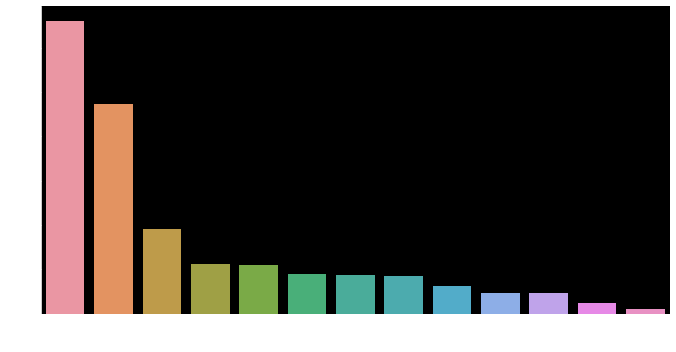

In [35]:
## feature importance

features_to_model = boston_df.drop( columns= 'house_price' ).columns

featureImp_df =   pd.DataFrame(  data=   [   i for i in zip( features_to_model, catboostReg_est.get_feature_importance() )  ],
                                 columns= [ 'feature', 'importance' ]
                              )

# print( np.sort( catboostReg_est.get_feature_importance() ) )
sns.catplot(  x= 'feature', y= 'importance', data= featureImp_df.sort_values( 'importance', ascending= False ), kind= 'bar', aspect= 1.9  );

### some handy udf

In [2]:
import re

def clean_text(str_var):    
    '''
    clean the text, useful for column header
    Arguments:
    str_var -- a string variable of any size

    Return:
    str_modf -- a cleaned string variable
    '''
    # lower case and revome begin & end space
    str_modf = str_var.lower().strip()
    # replace all non word chars ( everything except letters and nos )
    str_modf = re.sub( pattern= r'[^\w\s]', repl= '_', string= str_modf )
    # replace all runs of whitespace with '_'
    str_modf = re.sub( pattern= r'\s+', repl= '_', string= str_modf )
    # repalce > 1 consecutive '_'
    str_modf = re.sub( pattern= r'[__]+', repl= '_', string= str_modf )
    # remove begining and trailing _ : '__any_word____' --> 'any_word'
    def _remove_begin_end_(str_var):
        while True:
            if str_var[-1] == '_':
                str_var = str_modf[:len(str_modf)-1]
            else:                
                break                
        while True:
            if str_var[0] == '_':                            
                str_var = str_modf[1:len(str_modf)]
            else:                
                break
        return(str_var)
    str_modf = _remove_begin_end_(str_modf)
    return(str_modf)    
clean_colm_name = lambda df: [ clean_text(e_cNm) for e_cNm in df.columns ]

from IPython.display import display_html

def display_side_by_side(*args):
    '''
    func to display pandas dfs side by side
    input: dfs
    '''
    html_str = ''
    for df in args:
        html_str += df.to_html( )
        html_str += pd.DataFrame( [' ']*len(df), columns= [' '] ).to_html( index= False )  
        html_str += pd.DataFrame( [' ']*len(df), columns= [' '] ).to_html( index= False )   
        html_str += pd.DataFrame( [' ']*len(df), columns= [' '] ).to_html( index= False )        
    display_html(  html_str.replace( "table", "table style= 'display:inline'" ),
                   raw=True  )
    
def display_side_by_side_head(*args):
    '''
    func to display pandas dfs side by side
    input: dfs
    '''
    html_str = ''
    for df in args:
        html_str += df.head(5).to_html( )
        html_str += pd.DataFrame( [' ']*5, columns= [' '] ).to_html( index= False ) 
        html_str += pd.DataFrame( [' ']*5, columns= [' '] ).to_html( index= False )    
        html_str += pd.DataFrame( [' ']*5, columns= [' '] ).to_html( index= False )        
    display_html(  html_str.replace( "table", "table style= 'display:inline'" ),
                   raw=True  )
    
def print_tidy_JSON( json_data, indent_val = 6 ):
    print(  json.dumps( obj= json_data, indent= indent_val, sort_keys= True )  )
    
def get_numeric_colm( df, num= 26 ):
    '''
    returns the numeric column list (integer & float) from a dataframe
    Arguments:
        df is a dataframe
        num is the number of sampling to be considered for each column to check whether the column is numeric or not
    
    '''
    sample_num = min( len(df), num )
    numr_colm_ls = []
    for e_colm in df.columns:
        SerRndm1 = df[e_colm].dropna().sample( n= sample_num )
        if SerRndm1.str.isdecimal().sum() >= sample_num//2: 
            numr_colm_ls.append(e_colm)
        else:
            float_sum = 0
            for e_row in SerRndm1:
                try: float(e_row); float_sum += 1
                except: pass
            if float_sum >= sample_num: numr_colm_ls.append(e_colm)
    return(numr_colm_ls)